# Image filtering
- Upper Part of Jupyter Notebook is same as class
- Only change some methods to run in local desktop(3D map visualization to create outcome in html format)
- Also changed gisaengchung face to 'free' trump face picture from online resources.

In [2]:
import matplotlib as mpl
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
import numpy as np
import cv2 as cv
# this is only necessary for executing in colab
%matplotlib inline

In [3]:
img = cv.imread('trump.jpg')
# print some information about the image
print(img.shape)
print(type(img))

(1000, 1000, 3)
<class 'numpy.ndarray'>


So, now we know that our image has a certain size and is stored as a ```numpy``` array of - in this case - three dimensions.

Now, let's next look at the image using OpenCV's built-in ```imshow``` function like so:

#### Assignment #2

- Change the uploaded filtering.ipynb to work with a DIFFERENT picture with a CLEARLY visible face! Change the parameters for cropping, such that the new face will be used throughout the filtering code blocks.

- We changed the picture from Gisaengchung -> trump head picture(trump.jpg). 

In [ ]:
# let's make the image first a bit smaller
scale_percent = 50 # percent of original size
width = int(img.shape[1] * scale_percent / 100)
height = int(img.shape[0] * scale_percent / 100)
dim = (width, height)
# resize image
rimg = cv.resize(img, dim, interpolation = cv.INTER_AREA)

# the first parameter for the imshow function simply gives
# the title string for the window and the second the actual
# image array as numpy data
# -- regular call to opencv's imshow like this:
cv.imshow('trump',rimg)

# these two lines are necessary so that control is given back
# to the browser and jupyter when we show the images

# waits for a key indefinitely - blocking processing
cv.waitKey()
# once key has been pressed destroy all windows
cv.destroyAllWindows()

# call to replacement within colab like this:
# cv.imshow(rimg)


Let's use ```matplotlib``` to show the picture

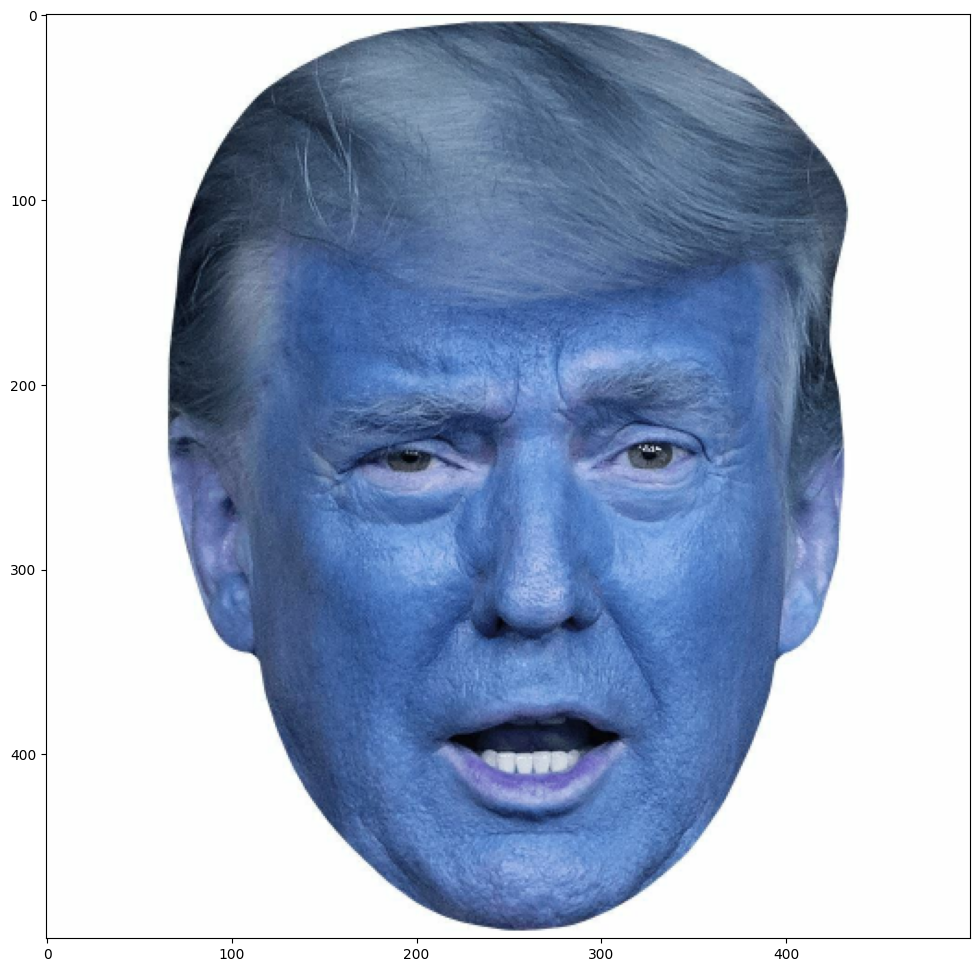

In [5]:
plt.figure(None, figsize=(12, 12))
plt.imshow(rimg)
plt.show()

Urgh. The colors are completely different.

This is because OpenCV stores images in BGR (BLUE - GREEN - RED) format, rather than the usual RGB (RED - GREEN - BLUE) format from other languages. So, if we want to show the image properly with ```matplotlib``` we have to convert the image first.

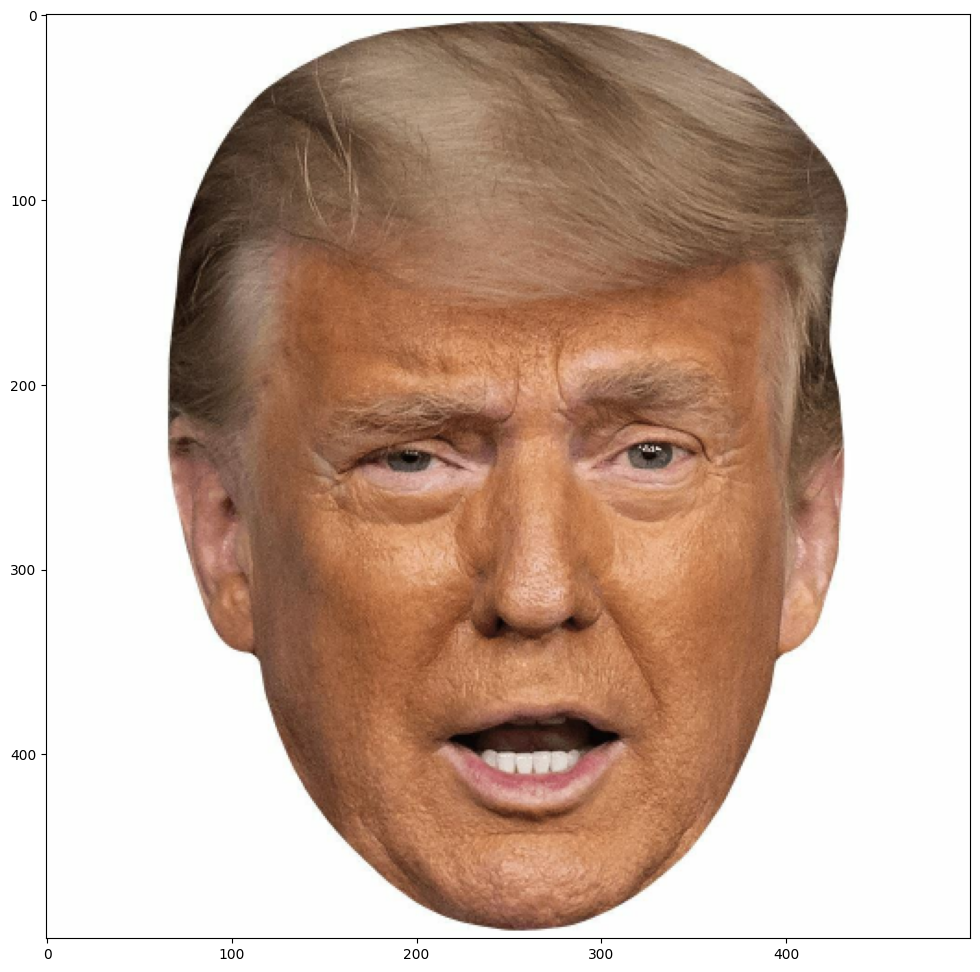

In [6]:
mrimg = cv.cvtColor(rimg, cv.COLOR_BGR2RGB)
plt.figure(None, figsize=(12, 12))
plt.imshow(mrimg)
plt.show()

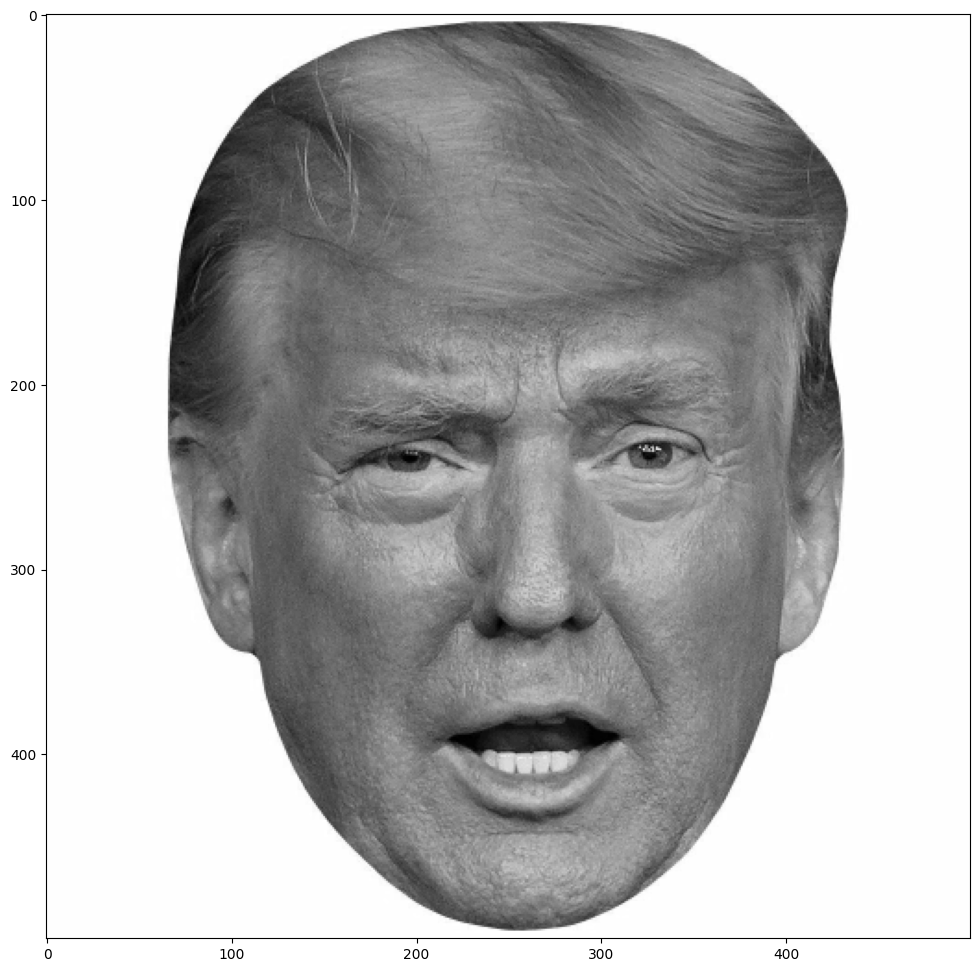

In [7]:
mrimg = cv.cvtColor(rimg, cv.COLOR_BGR2GRAY)
plt.figure(None, figsize=(12, 12))
plt.imshow(mrimg,cmap='gray')
plt.show()

Now, let's cut out a section of the image and let's display it as a grid of values. Most of the code below is to make sure that the plotting works fine and that we can add the pixel intensity values in a nice way to the plot.

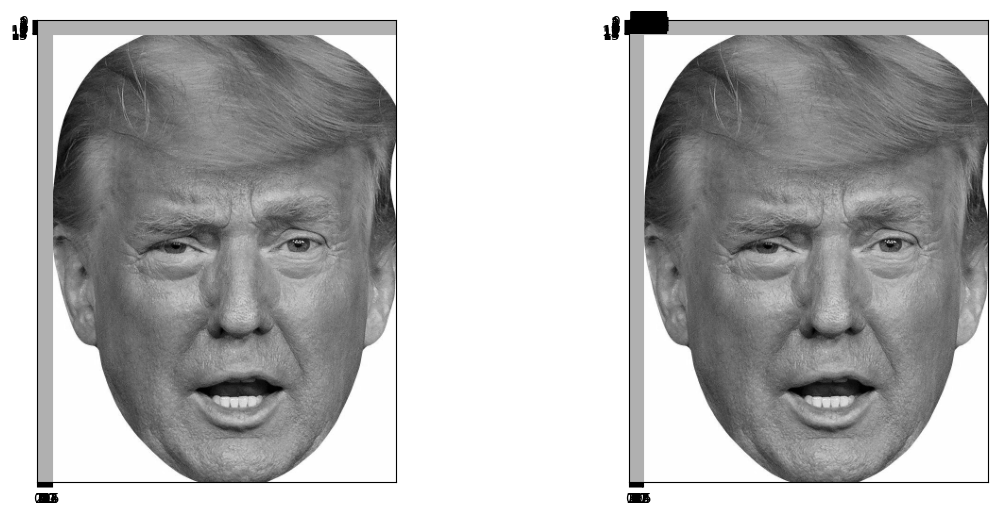

In [ ]:
'''
I cropped it little bit more to remove the white space arond the face here,
But later filtering steps, I used original face(Since it already have great face picture)
'''
roi = mrimg[0:490,50:430] 
# the extent variable is important for ensuring the right
# kind of plotting area!
extent = (0, roi.shape[1], roi.shape[0], 0)
plt.figure(None, figsize=(14, 6))
plt.subplot(1,2,1)
plt.imshow(roi,cmap='gray',extent=extent)
ax = plt.gca()
# this makes sure we have the correct grid lines
major_ticks = np.arange(0, 16, 1)
ax.set_xticks(major_ticks)
ax.set_yticks(major_ticks)
plt.grid(True)
plt.subplot(1,2,2)
plt.imshow(roi,cmap='gray',extent=extent)
ax = plt.gca()
major_ticks = np.arange(0, 16, 1)
ax.set_xticks(major_ticks)
ax.set_yticks(major_ticks)
# plots pixel intensity values with text color depending on
# the pixel value
for i in range(0,15):
    for j in range(0,15):
        if roi[j,i]>127:
            plt.text(i+0.1,j+0.6,str(roi[j,i]),color='black')
        else:
            plt.text(i+0.1,j+0.6,str(roi[j,i]),color='white')
plt.grid(True)

Next, let's plot the image function F(x,y) as a surface.

In [9]:
# definition of x and y and meshgrid
x = np.arange(0, mrimg.shape[1], 1)
y = np.arange(0, mrimg.shape[0], 1)
xx, yy = np.meshgrid(x, y)

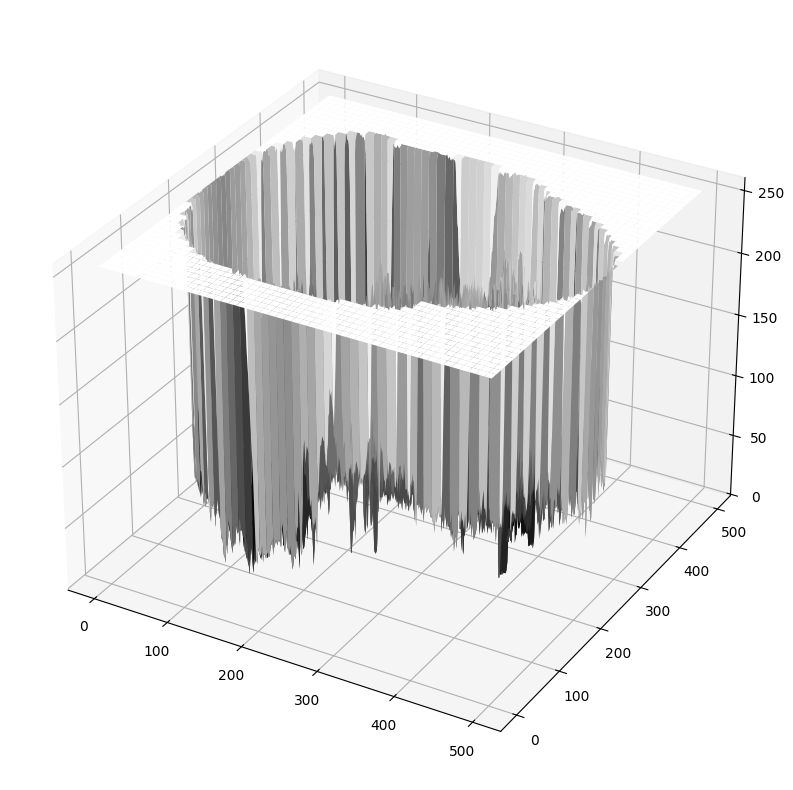

In [10]:
# code how to do this in Matplotlib, which does NOT work well within Colab
fig = plt.figure(None, figsize=(10, 10))
ax = fig.add_subplot(111, projection='3d') # fig.gca(projection='3d')
ax.plot_surface(yy,xx,mrimg[yy,xx],cmap='gray')
plt.show()

In [ ]:
'''
For this part, I could not create this 3D Image Surface in my local machine,
Therefore, I use .html format file to visualize and save.
'''
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go

# Create 3D Surface Plot
fig = go.Figure(data=[go.Surface(z=mrimg)])

fig.update_layout(
    title='Image Surface', 
    autosize=False,
    width=500, 
    height=500,
    margin=dict(l=65, r=50, b=65, t=90),
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Intensity'
    )
)

# Show in HTML Broswer
fig.write_html("image_surface.html")


import webbrowser
webbrowser.open("image_surface.html")

True

## Arithmetics with images

Let's add something to our function

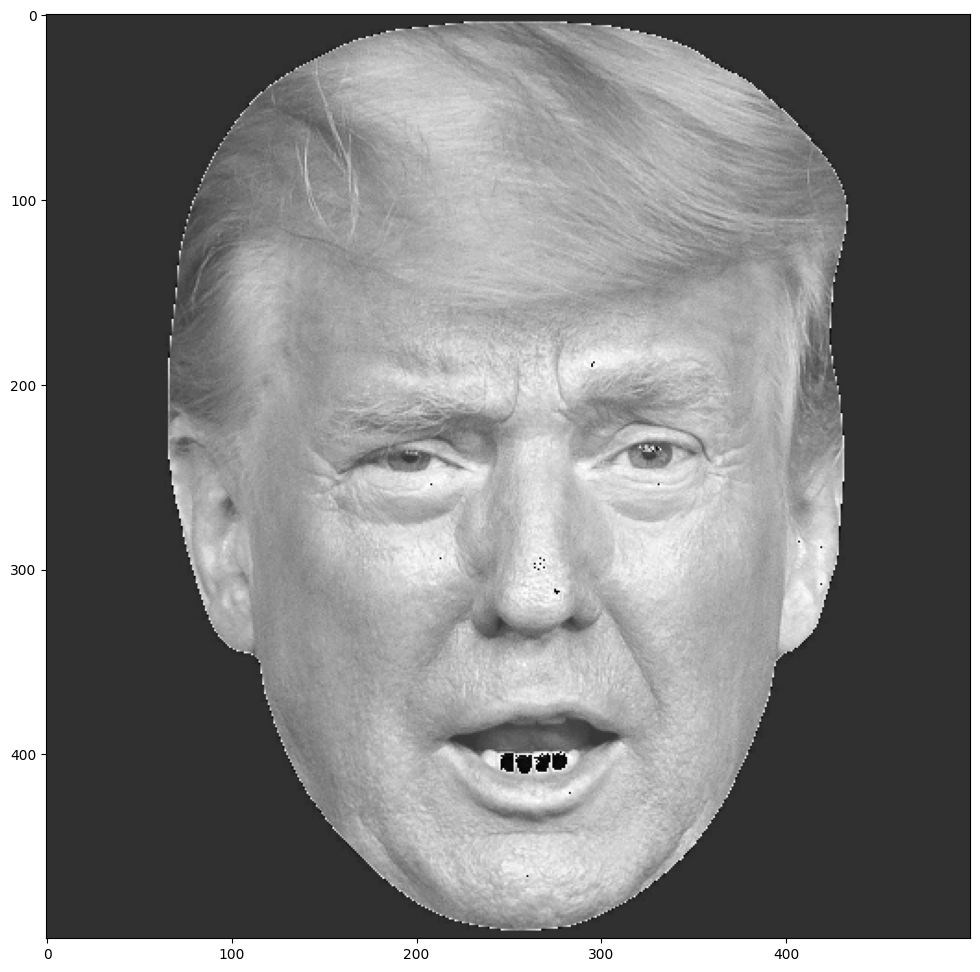

In [12]:
plt.figure(None, figsize=(12, 12))
plt.imshow(mrimg+50,cmap='gray')
plt.show()

That result cannot be correct - some parts of the image turn black, when actually the whole image should get brighter. This is because of clipping!

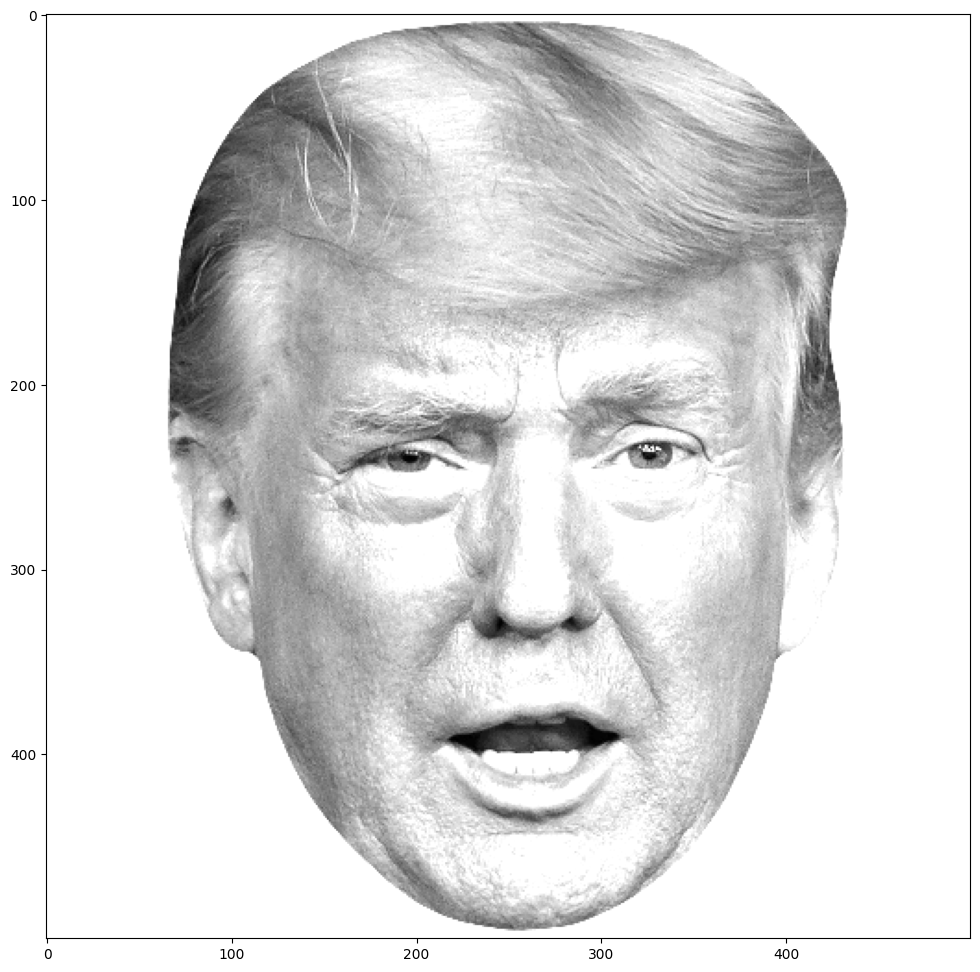

In [13]:
plt.figure(None, figsize=(12, 12))
plt.imshow(np.clip(mrimg.astype(float)+100,0,255),cmap='gray')
plt.show()

Here's the inverse of the image

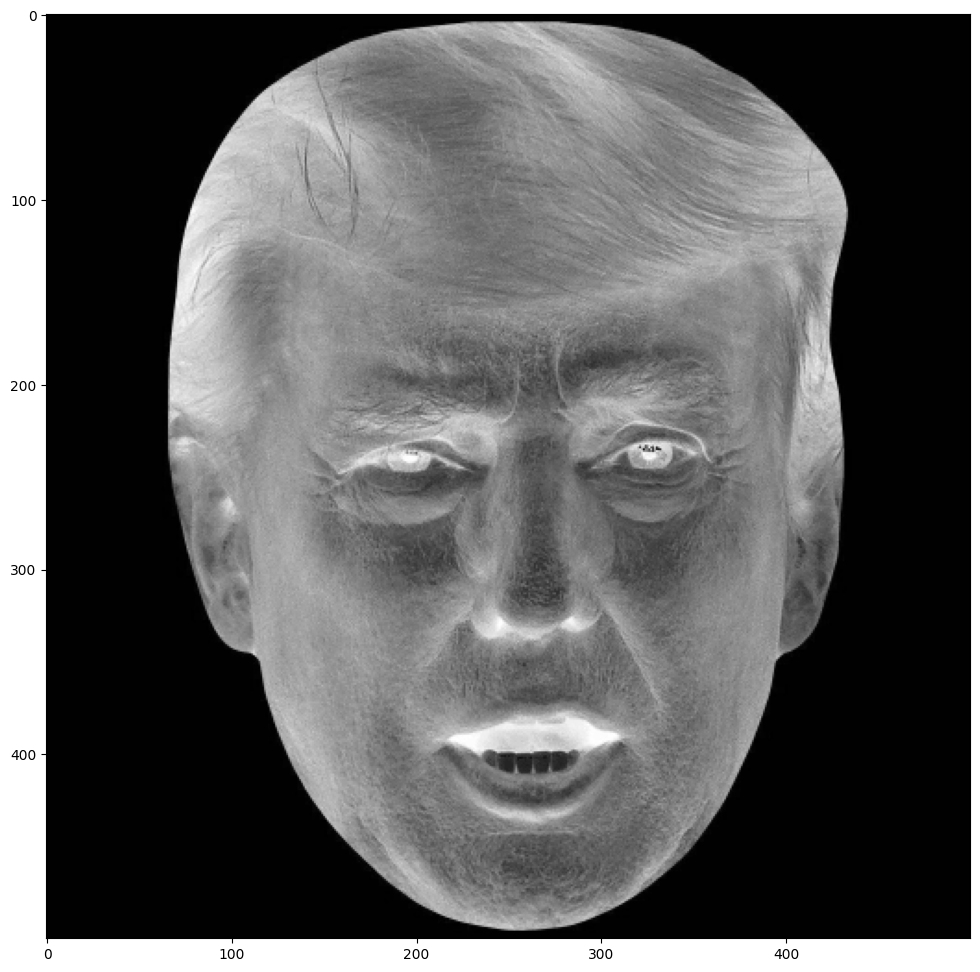

In [14]:
plt.figure(None, figsize=(12, 12))
plt.imshow(255-mrimg,cmap='gray')
plt.show()

# Filtering

Let's apply our simple retina-like filter to a signal

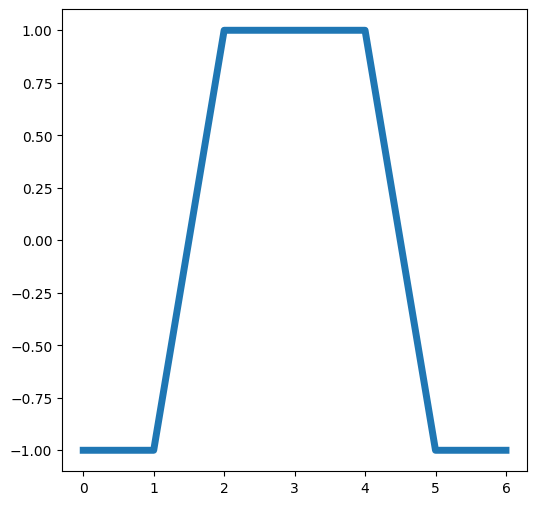

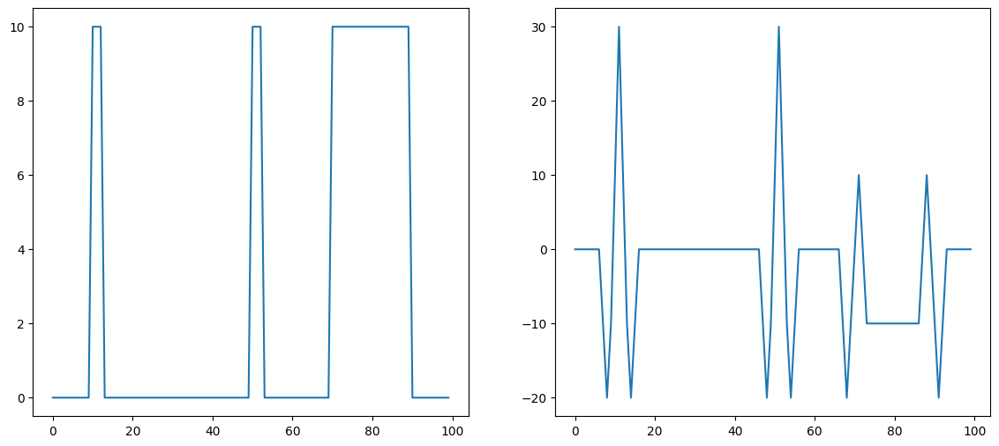

In [15]:
signal = np.zeros((100,1))
signal[10:13]=10
signal[50:53]=10
signal[70:90]=10

filtered_signal = np.zeros_like(signal)
weights = np.array((-1.0,-1.0,1.0,1.0,1.0,-1.0,-1.0))
plt.figure(None, figsize=(6, 6))
plt.plot(weights,linewidth=5)
for i in range(3,len(signal)-3):
    filtered_signal[i]=np.dot(weights,signal[i-3:i+4])

plt.figure(None, figsize=(14, 6))
plt.subplot(1,2,1)
plt.plot(signal)
plt.subplot(1,2,2)
plt.plot(filtered_signal)
plt.show()

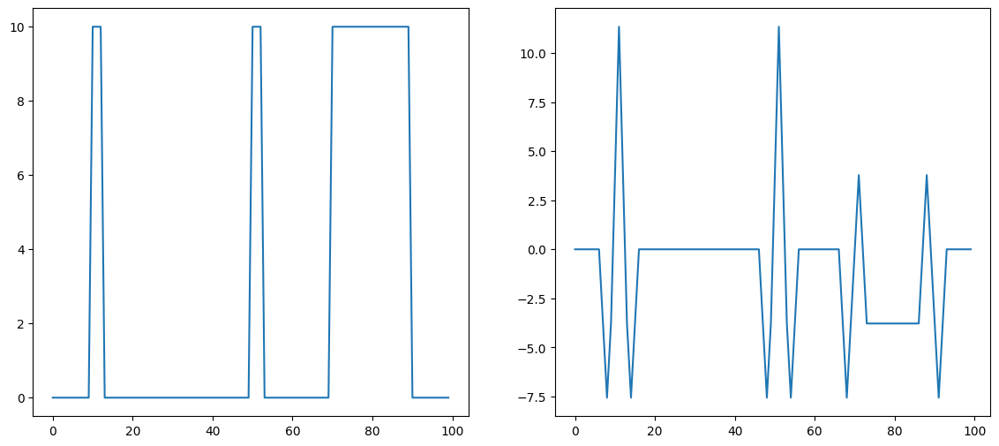

In [16]:
weights = np.array((-1,-1,1,1,1,-1,-1))
weights = weights/np.linalg.norm(weights, ord=2, keepdims=True)
for i in range(3,len(signal)-3):
    filtered_signal[i]=np.dot(weights,signal[i-3:i+4])

plt.figure(None, figsize=(14, 6))
plt.subplot(1,2,1)
plt.plot(signal)
plt.subplot(1,2,2)
plt.plot(filtered_signal)
plt.show()

## Scanline
Let's see what the image function says for our picture at one scanline.

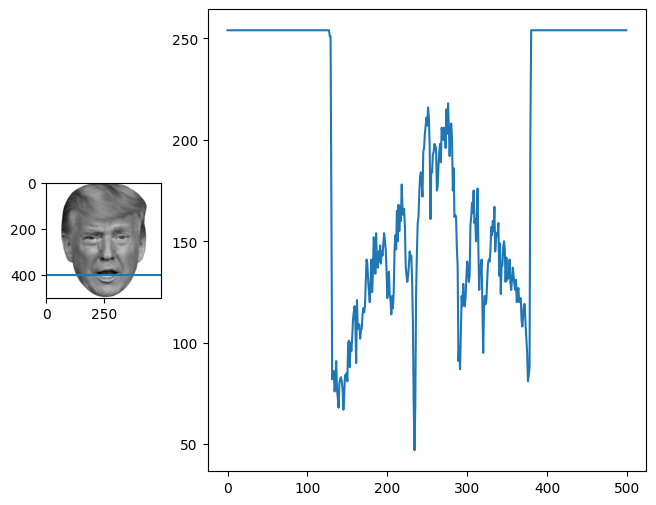

In [17]:
cuty = 400
plt.figure(None, figsize=(14, 6))
grid = plt.GridSpec(1, 7, wspace=0.4, hspace=0.3)
plt.subplot(grid[0, 0])
plt.imshow(mrimg,cmap='gray')
plt.plot((0,mrimg.shape[1]-1),(cuty,cuty))
plt.subplot(grid[0, 1:4])
oneline = mrimg[cuty,:]
plt.plot(oneline)
plt.show()

## Filtering one image line
Let's apply our filter to the scanline in the image.

In [18]:
newoneline = np.zeros_like(oneline)
weights = (-1,-1,1,1,1,-1,-1)
for i in range(3,len(oneline)-3):
    newoneline[i]=np.dot(weights,oneline[i-3:i+4])

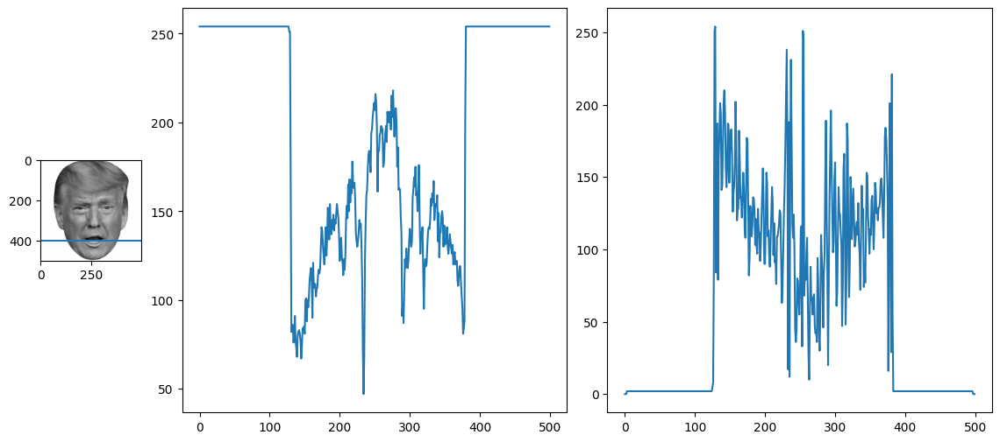

In [19]:
plt.figure(None, figsize=(14, 6))
grid = plt.GridSpec(1, 7, wspace=0.4, hspace=0.3)
plt.subplot(grid[0, 0])
plt.imshow(mrimg,cmap='gray')
plt.plot((0,mrimg.shape[1]-1),(cuty,cuty))
plt.subplot(grid[0, 1:4])
plt.plot(oneline)
plt.subplot(grid[0, 4:])
plt.plot(newoneline)
plt.show()

## Filtering in 2D
Let's take the simple averaging filter and run it across the image.

In [20]:
weights2d = [
    (1,1,1),
    (1,1,1),
    (1,1,1)
]
weights2d = np.array(weights2d)
weights2d = 1/np.sum(weights2d)*weights2d

In [21]:
filteredmrimg = np.zeros_like(mrimg)
for i in range(1,mrimg.shape[1]-1):
    for j in range(1,mrimg.shape[0]-1):
        filteredmrimg[j,i]=np.sum(weights2d*mrimg[j-1:j+2,i-1:i+2])

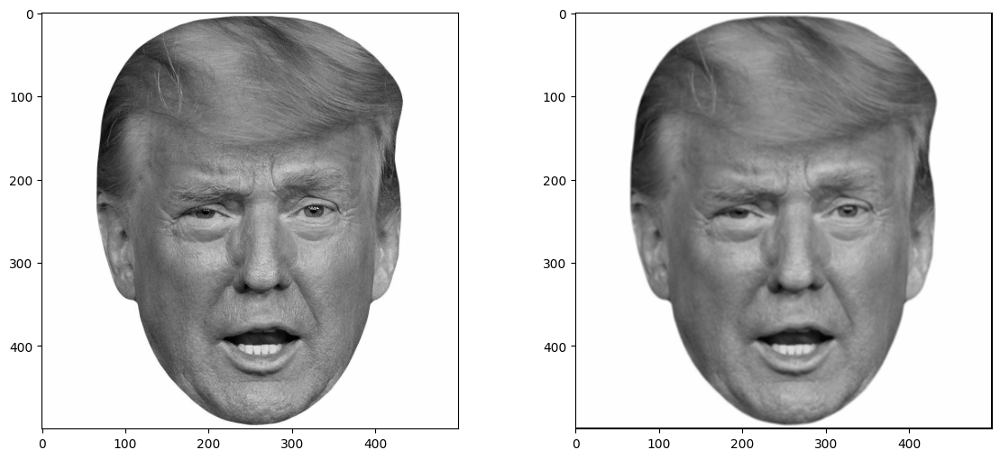

In [22]:
plt.figure(None, figsize=(14, 6))
plt.subplot(1,2,1)
plt.imshow(mrimg,cmap='gray')
plt.subplot(1,2,2)
plt.imshow(filteredmrimg,cmap='gray')
plt.show()

In [23]:
# this function will filter an roi using a set of weights
def filter_and_plot(weights,roi):
    # these two lines are important as they ensure correct
    # computations!
    weights = weights.astype(float)
    roi = roi.astype(float)
    # this holds the end result
    filtered = np.zeros_like(roi)
    width = int((weights.shape[1]-1)/2)
    height = int((weights.shape[0]-1)/2)
    # do the filtering
    for i in range(height,roi.shape[1]-height):
        for j in range(width,roi.shape[0]-width):
            filtered[j,i]=np.sum(weights*roi[j-width:j+width+1,i-height:i+height+1])
    # plot the original, the filter, and the filtered image
    plt.figure(None, figsize=(14, 6))
    grid = plt.GridSpec(1, 7, wspace=0.4, hspace=0.3)
    plt.subplot(grid[0, 0:3])
    plt.imshow(roi,cmap='gray')
    plt.subplot(grid[0, 3])
    extent = (0, weights.shape[1], weights.shape[0], 0)
    plt.imshow(weights,cmap='gray',extent=extent)
    plt.axis('off')
    if width<5:
        for i in range(0,len(weights)):
            for j in range(0,len(weights)):
                if weights[i,j]>0.5*np.max(weights):
                    plt.text(j+0.1,i+0.6,'{0:.2f}'.format(weights[i,j]),color='black')
                else:
                    plt.text(j+0.1,i+0.6,'{0:.2f}'.format(weights[i,j]),color='white')
    plt.grid(True)
    plt.subplot(grid[0, 4:])
    plt.imshow(filtered,cmap='gray')
    plt.show()
    return(filtered)

In [ ]:
faceroi = mrimg

## Different filters
Let's try out a few simple filters.

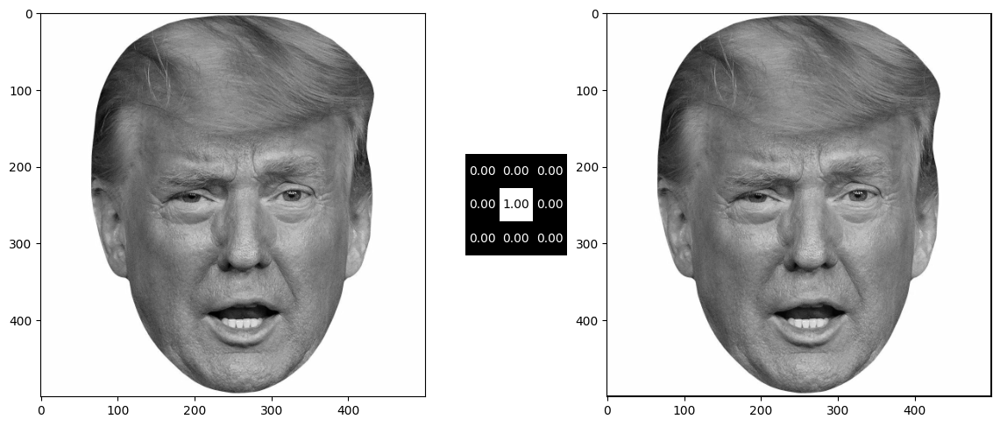

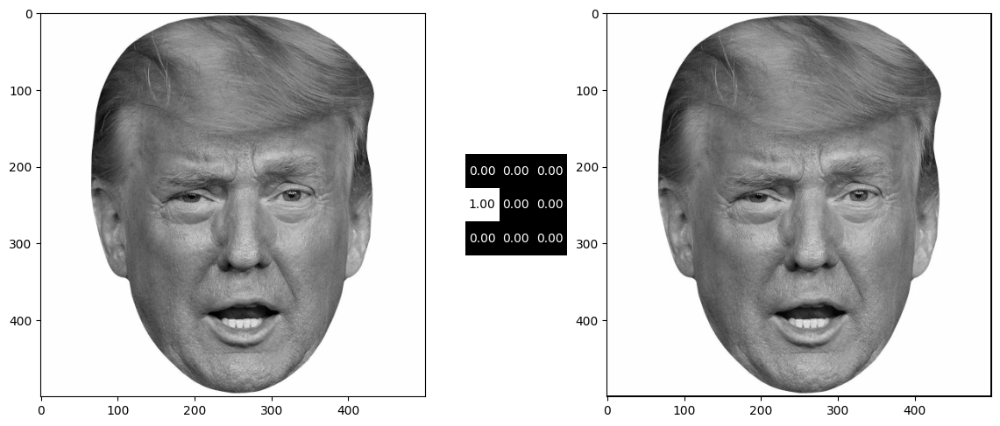

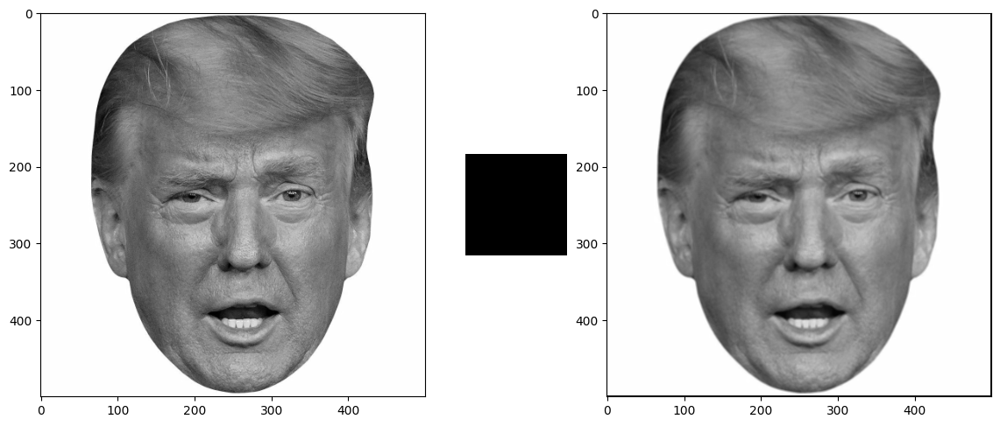

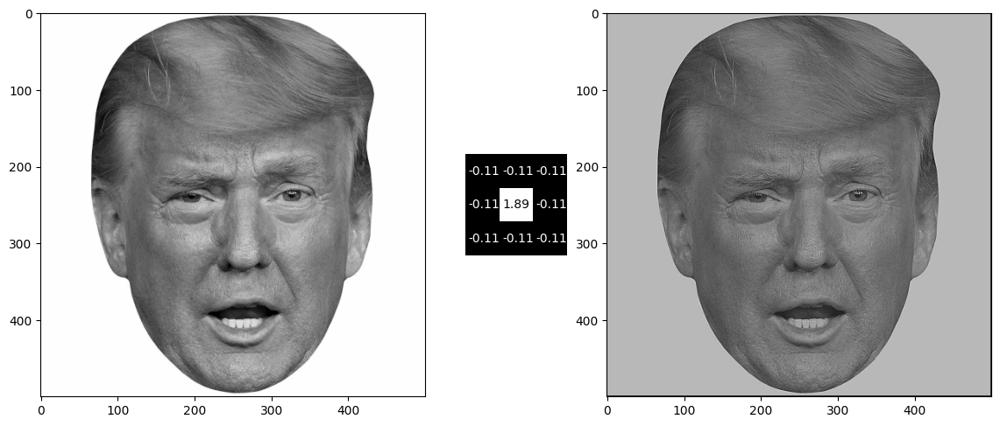

In [25]:
filter_id = np.array([
    (0,0,0),
    (0,1,0),
    (0,0,0)
])
filter_id = 1/np.sum(filter_id)*filter_id

filter_and_plot(filter_id,faceroi)

filter_left = np.array([
    (0,0,0),
    (1,0,0),
    (0,0,0)
])
filter_left = 1/np.sum(filter_left)*filter_left


filter_and_plot(filter_left,faceroi)

filter_blur = np.array([
    (1,1,1),
    (1,1,1),
    (1,1,1)
])
filter_blur = 1/np.sum(filter_blur)*filter_blur


filter_and_plot(filter_blur,faceroi)


filter_contrast = 2*filter_id - filter_blur
filter_contrast = 1/np.sum(filter_contrast)*filter_contrast


fc = filter_and_plot(filter_contrast,faceroi)

## Larger blur
Let's use a bigger averaging filter and see its effects.

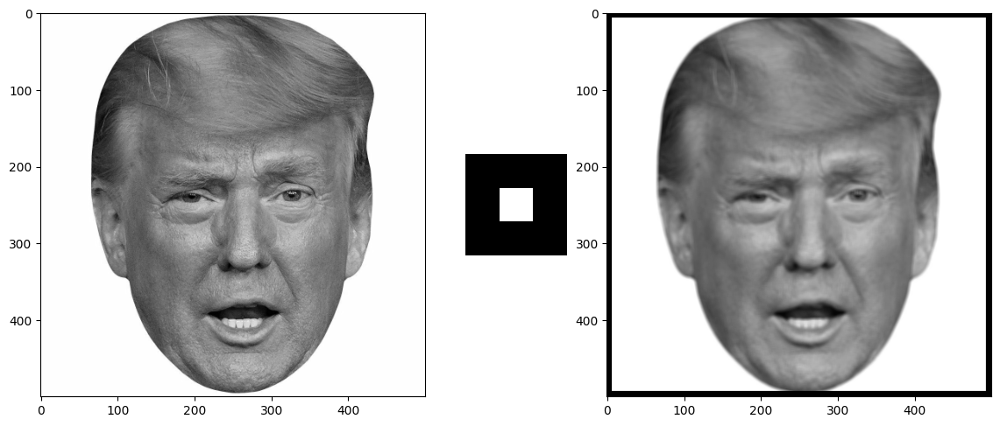

In [26]:
filter_blur_big = np.zeros((15,15))
filter_blur_big[5:10,5:10]=1
filter_blur_big = 1/np.sum(filter_blur_big)*filter_blur_big
f=filter_and_plot(filter_blur_big,faceroi)

## High-pass
Here's the difference between the blurred and the original iamge. Per definition it contains the high frequencies.

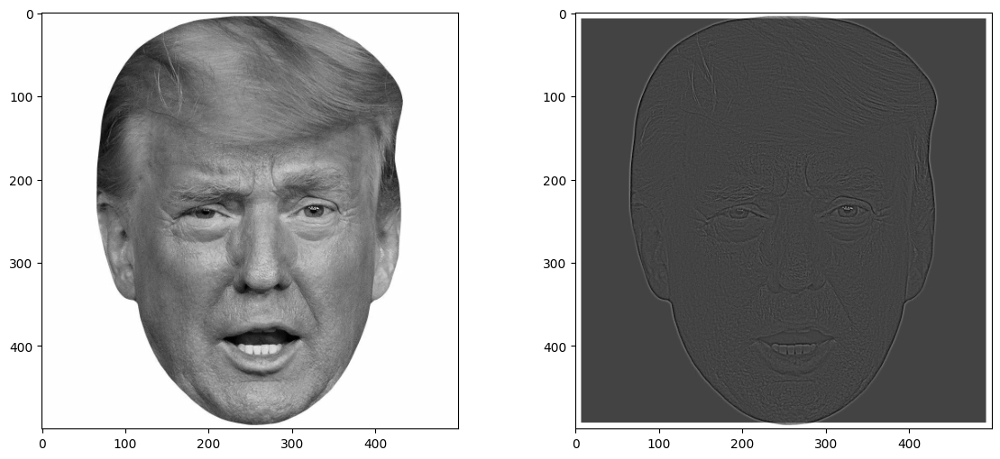

In [27]:
plt.figure(None, figsize=(14, 6))
plt.subplot(1,2,1)
plt.imshow(faceroi,cmap='gray')
plt.subplot(1,2,2)
diffimg = faceroi-f.astype(float)
plt.imshow(diffimg,cmap='gray')
plt.show()

## Gradual sharpening
Let's add more and more of the difference image to the blurred image

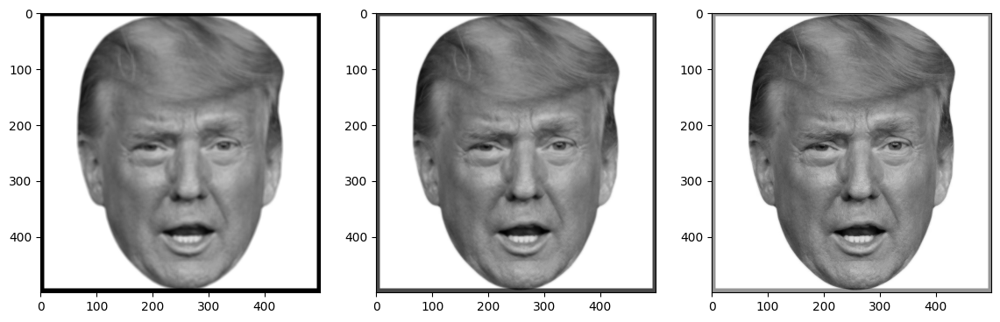

In [28]:
plt.figure(None, figsize=(14, 6))
plt.subplot(1,3,1)
plt.imshow(f,cmap='gray')
plt.subplot(1,3,2)
f = f.astype(float)
plt.imshow(f+0.3*diffimg,cmap='gray')
plt.subplot(1,3,3)
plt.imshow(f+0.6*diffimg,cmap='gray')
plt.show()

## Derivatives
Now, let's derive our image function using the simple derivative approximation.

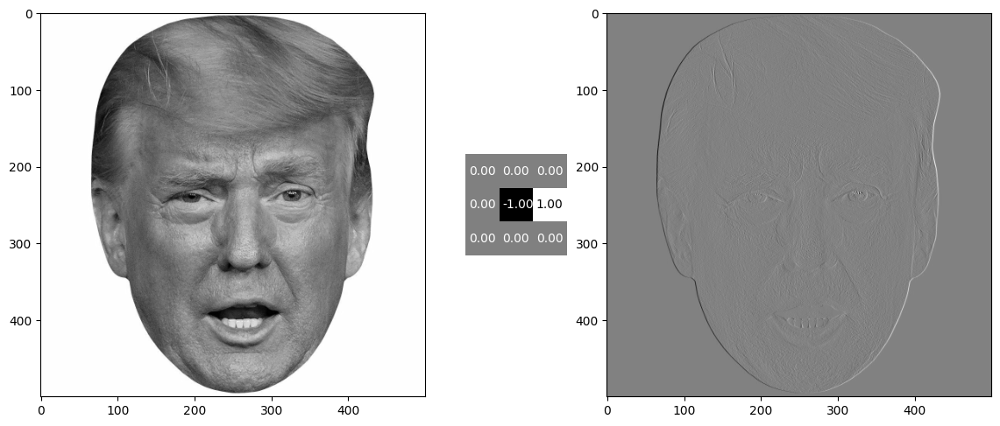

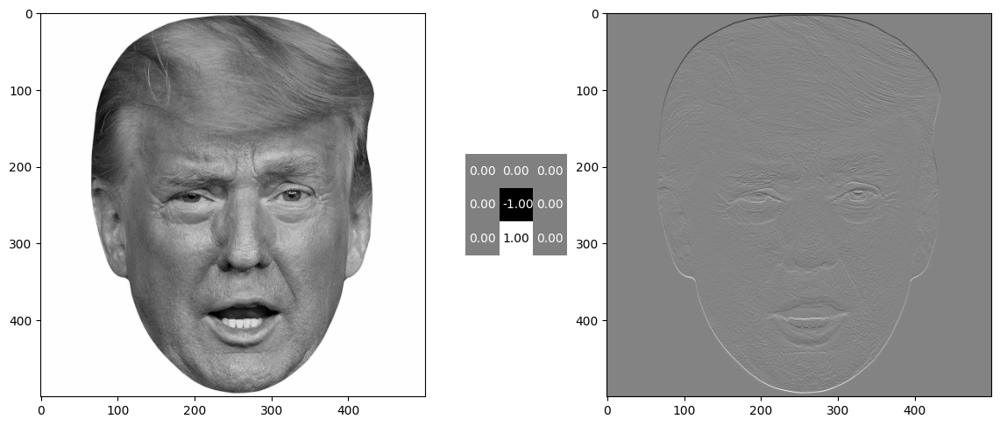

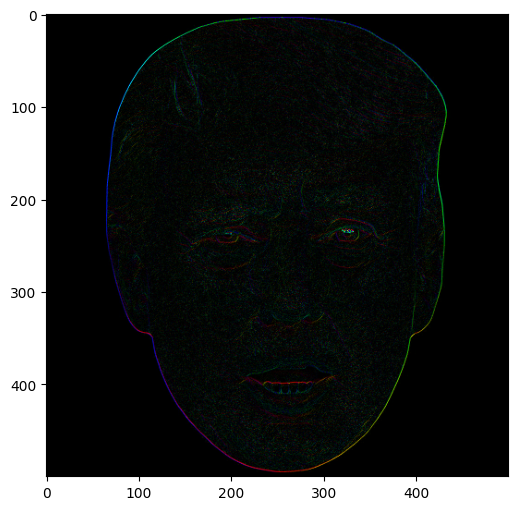

In [29]:
filter_dx = np.array([
    (0,0,0),
    (0,-1,1),
    (0,0,0)
])
fdx=filter_and_plot(filter_dx,faceroi)

filter_dy = np.array([
    (0,0,0),
    (0,-1,0),
    (0,1,0)
])
fdy=filter_and_plot(filter_dy,faceroi)

plt.figure(None, figsize=(6, 6))
hsv = np.zeros((fdx.shape[1],fdx.shape[0],3))
hsv[...,1] = 255
ang = np.arctan2(fdx,fdy)
hsv[...,0] = ang*180/np.pi
mag = np.sqrt(fdx*fdx+fdy*fdy)
hsv[...,2] = (mag-np.min(mag))/(np.max(mag)-np.min(mag))*255
plt.imshow(cv.cvtColor(np.uint8(hsv),cv.COLOR_HSV2RGB_FULL))
plt.show()

## Sobel filter
Let's implement the simple Gaussian derivative filter approximation - the Sobel filters.

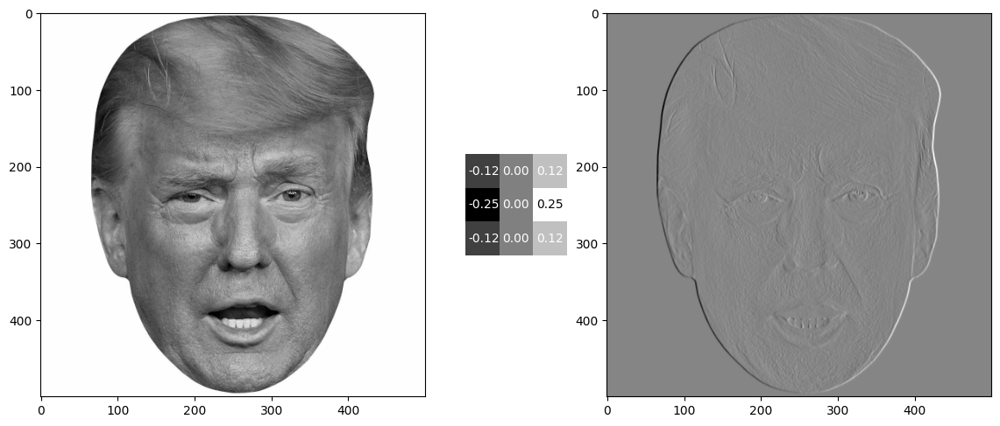

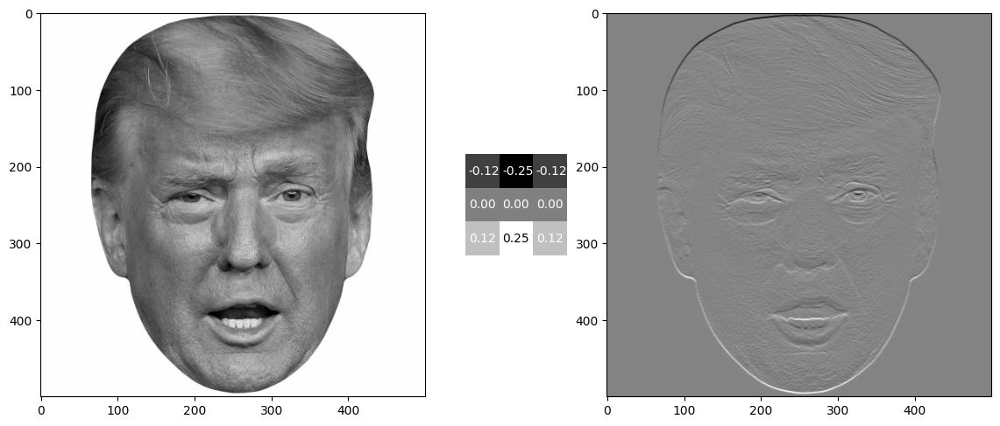

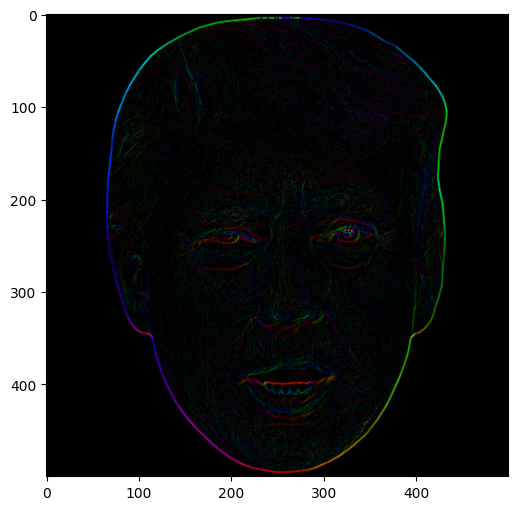

In [30]:
filter_sobelx = np.array([
    (-1,0,1),
    (-2,0,2),
    (-1,0,1)
])
fsx=filter_and_plot(1/8*filter_sobelx,faceroi)

filter_sobely = np.array([
    (-1,-2,-1),
    (0,0,0),
    (1,2,1)
])
fsy=filter_and_plot(1/8*filter_sobely,faceroi)

plt.figure(None, figsize=(6, 6))
hsv = np.zeros((fsx.shape[1],fsx.shape[0],3))
hsv[...,1] = 255
ang = np.arctan2(fsx,fsy)
hsv[...,0] = ang*180/np.pi
mag = np.sqrt(fsx*fsx+fsy*fsy)
hsv[...,2] = (mag-np.min(mag))/(np.max(mag)-np.min(mag))*255
plt.imshow(cv.cvtColor(np.uint8(hsv),cv.COLOR_HSV2RGB_FULL))
plt.show()

### Assignmnet # 2 Implementing and extending filtering.ipynb

- Now, At the bottom of the notebook, add another function filter with the same input and output parameters that only does the filtering without the plotting based on the filter_and_plot function.

- Next, evaluate the timing of your filter function for a 500x500 pixel grey-scale image of your choice against the OpenCV function cv2.filter2D for simple, normalized box-filters of size 3x3, 5x5, 9x9, 15x15, 23x23. A box-filter consists of only “1”s in all elements of the filter and is an averaging filter.

- For evaluating the timing use the time package from python (do not use the jupyter magic commands), run 50 repetitions for each of the 5 filter sizes, collect the output and then plot it nicely (importantly, make sure to include information about the 50 repetitions into the plot!!!), comparing each of the algorithms (filter, cv2.filter2D).

- Insert a discussion into the notebook that interprets the findings of the comparison.

- Execute the whole notebook and send the executed notebook (which now should show all images) in your submission file. Just to be on the safe side, please also include the image(s) you selected!

In [31]:
'''
Add Filter Function
Baiscally Same as Filter_and_plot, but just removed plotting parts
'''
def filter(weights, image):
    weights = weights.astype(float)
    image = image.astype(float)
    filtered = np.zeros_like(image)
    width = int((weights.shape[1] - 1) / 2)
    height = int((weights.shape[0] - 1) / 2)
    for i in range(height, image.shape[1] - height):
        for j in range(width, image.shape[0] - width):
            filtered[j, i] = np.sum(weights * image[j - width:j + width + 1, i - height:i + height + 1])
    return filtered

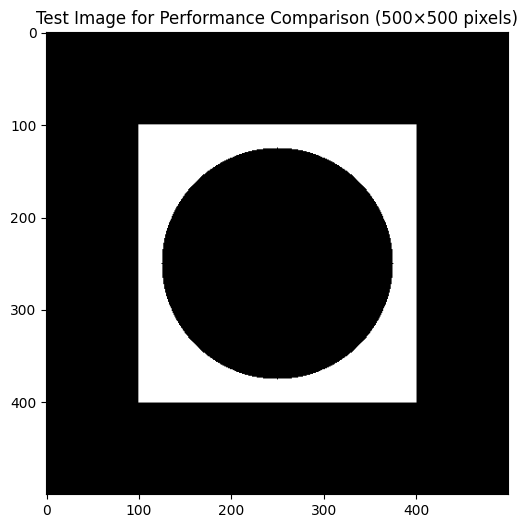

In [ ]:
'''
Create a 500x500 grayscale test image for timing comparison
'''
test_image = np.zeros((500, 500), dtype=np.uint8)
# Add some patterns maybe to visualize the filter process later
# # We thought about drawing 'Star' or 'Triangle', and then when we check open-cv library
# We realize we have to draw it with fillPoly() and calculate all the points...
# So, we just added simple Square & circle
cv.rectangle(test_image, (100, 100), (400, 400), 255, -1)
cv.circle(test_image, (250, 250), 125, 0, -1)
# Show the test image
plt.figure(None, figsize=(6, 6))
plt.imshow(test_image, cmap='gray')
plt.title("Test Image for Performance Comparison (500×500 pixels)")
plt.show()

In [51]:
''' 
Import time module for performance measurement
'''
import time

In [ ]:
'''
Define filter sizes & set up 
'''
filter_sizes = [3, 5, 9, 15, 23]
repetitions = 50

# Prepare results containers
custom_times = {size: [] for size in filter_sizes}
opencv_times = {size: [] for size in filter_sizes}

In [55]:
'''
Run timing tests & Measure the difference
'''
print(f"\nRunning timing comparison: {repetitions} repetitions for each filter size.")
for size in filter_sizes:
    print(f"Testing {size}×{size} filter", end="", flush=True)
    
    # Create normalized box filter
    box_filter = np.ones((size, size)) / (size * size)
    
    # Time custom filter
    for rep in range(repetitions):
        start_time = time.time()
        _ = filter(box_filter, test_image)
        end_time = time.time()
        custom_times[size].append((end_time - start_time) * 1000)  # Convert to milliseconds
    
    # Time OpenCV filter2D
    for rep in range(repetitions):
        start_time = time.time()
        _ = cv.filter2D(test_image, -1, box_filter)
        end_time = time.time()
        opencv_times[size].append((end_time - start_time) * 1000)  # Convert to milliseconds
    
    print(f" Test Done. Average times - My Custom: {np.mean(custom_times[size]):.2f}ms, OpenCV: {np.mean(opencv_times[size]):.2f}ms")


Running timing comparison: 50 repetitions for each filter size.
Testing 3×3 filter Test Done. Average times - My Custom: 1120.46ms, OpenCV: 0.21ms
Testing 5×5 filter Test Done. Average times - My Custom: 1182.42ms, OpenCV: 0.47ms
Testing 9×9 filter Test Done. Average times - My Custom: 1080.09ms, OpenCV: 1.46ms
Testing 15×15 filter Test Done. Average times - My Custom: 1043.25ms, OpenCV: 2.46ms
Testing 23×23 filter Test Done. Average times - My Custom: 1093.93ms, OpenCV: 2.62ms


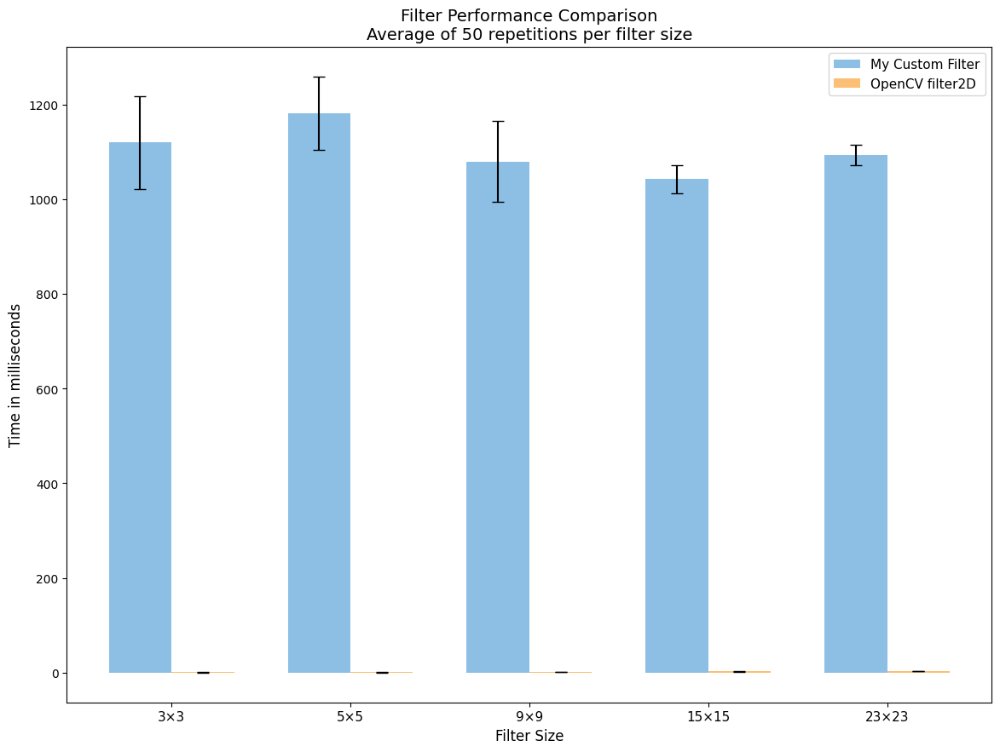

In [ ]:
'''
Calculate & Visualize the results #1
Here, We realized that We cannot draw like this...
Esepcially, when the average time for my custom is 1043~1182ms while OpenCV is only 0.21~2.62ms
'''
# Calculate statistics
custom_means = [np.mean(custom_times[size]) for size in filter_sizes]
custom_stds = [np.std(custom_times[size]) for size in filter_sizes]
opencv_means = [np.mean(opencv_times[size]) for size in filter_sizes]
opencv_stds = [np.std(opencv_times[size]) for size in filter_sizes]

# 1. Create plot comparing timing results
plt.figure(figsize=(14, 10))
x = np.arange(len(filter_sizes))
width = 0.35

# Create bar plot with error bars for standard deviation
plt.bar(x - width/2, custom_means, width, label='My Custom Filter', 
        color='#5DA5DA', alpha=0.7, yerr=custom_stds, capsize=5)
plt.bar(x + width/2, opencv_means, width, label='OpenCV filter2D', 
        color='#FAA43A', alpha=0.7, yerr=opencv_stds, capsize=5)

plt.xlabel('Filter Size', fontsize=12)
plt.ylabel('Time in milliseconds', fontsize=12)
plt.title(f'Filter Performance Comparison\nAverage of {repetitions} repetitions per filter size', fontsize=14)
plt.xticks(x, [f'{size}×{size}' for size in filter_sizes], fontsize=11)
plt.legend(fontsize=11)

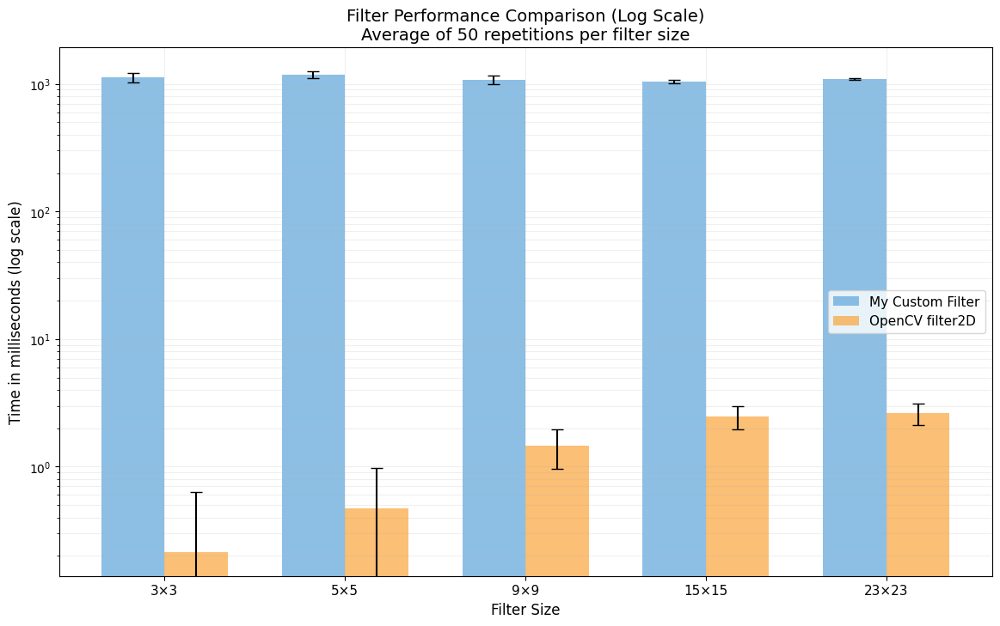

In [ ]:
'''
Calculate & Visualize the results #2
After visualizing above(#1), We use log scale to visualize since there is huge value difference between OpenCV and MyCustomFilter.
'''
# 2. New Log Scale Plot
plt.figure(figsize=(14, 8))
x = np.arange(len(filter_sizes))
width = 0.35

# Create bar plot with log scale
plt.bar(x - width/2, custom_means, width, label='My Custom Filter', 
        color='#5DA5DA', alpha=0.7, yerr=custom_stds, capsize=5)
plt.bar(x + width/2, opencv_means, width, label='OpenCV filter2D', 
        color='#FAA43A', alpha=0.7, yerr=opencv_stds, capsize=5)

plt.yscale('log')  # <-- Here, we used log scale to observe the difference for OpenCV
plt.xlabel('Filter Size', fontsize=12)
plt.ylabel('Time in milliseconds (log scale)', fontsize=12)
plt.title('Filter Performance Comparison (Log Scale)\nAverage of {} repetitions per filter size'.format(repetitions), fontsize=14)
plt.xticks(x, [f'{size}×{size}' for size in filter_sizes], fontsize=11)
plt.legend(fontsize=11)
plt.grid(True, which="both", ls="-", alpha=0.2)
plt.show()

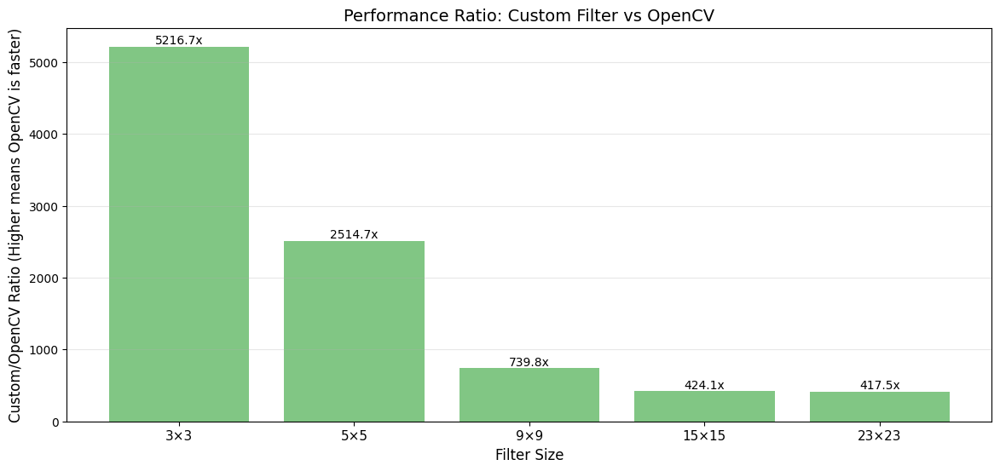

In [ ]:
'''
Calculate & Visualize the results #3
Now, We can observe the performance difference between OpenCV filer and My Custom Filter.
Also, Since we can observe the performance by the 'Filter Size', First, we compared the difference(in ratio) between My custom filter & OpenCV filter 
By drawing performance ratio graph.
'''
# 3. Visualizing Ratio Graph to check the performance difference between each filter size
ratios = [custom/opencv if opencv > 0 else float('inf') for custom, opencv in zip(custom_means, opencv_means)]

plt.figure(figsize=(14, 6))
plt.bar(x, ratios, color='#4CAF50', alpha=0.7)
plt.xlabel('Filter Size', fontsize=12)
plt.ylabel('Custom/OpenCV Ratio (Higher means OpenCV is faster)', fontsize=12)
plt.title('Performance Ratio: Custom Filter vs OpenCV', fontsize=14)
plt.xticks(x, [f'{size}×{size}' for size in filter_sizes], fontsize=11)

# 각 바에 값 표시
for i, ratio in enumerate(ratios):
    if np.isfinite(ratio):
        plt.text(i, ratio, f'{ratio:.1f}x', ha='center', va='bottom', fontsize=10)
    else:
        plt.text(i, plt.ylim()[1]*0.9, 'Inf', ha='center', va='bottom', fontsize=10)

plt.grid(True, axis='y', alpha=0.3)
plt.show()

In [ ]:
# Print detailed statistics
print("\nDetailed Performance Results:")
print("-" * 60)
print(f"{'Filter Size':<15}{'Custom Mean (ms)':<20}{'OpenCV Mean (ms)':<20}{'Speedup':<10}")
print("-" * 60)

for i, size in enumerate(filter_sizes):
    print(f"{size}×{size:<13}{custom_means[i]:<20.2f}{opencv_means[i]:<20.2f}{opencv_means[i]/custom_means[i]:<10.2f}")

print("-" * 60)
print(f"Each test repeated {repetitions} times on a {test_image.shape[0]}×{test_image.shape[1]} gray-scale image.")


Detailed Performance Results:
------------------------------------------------------------
Filter Size    Custom Mean (ms)    OpenCV Mean (ms)    Speedup   
------------------------------------------------------------
3×3            1080.24             0.21                0.00      
5×5            1189.04             0.49                0.00      
9×9            1144.60             1.65                0.00      
15×15           1130.15             2.75                0.00      
23×23           1202.48             3.26                0.00      
------------------------------------------------------------
Each test repeated 50 times on a 500×500 gray-scale image.


#### Why OepnCV May Outperform the Custom Filter

- OpenCV is implemented in highly optimized C/C++ code that leverages low-level system optimizations, including vectorized operations and CPU-specific instructions. 

- In contrast, the custom filter function uses pure Python 'for' loops(with numpy calculation), which are significantly slower due to the overhead of interpreted code. 


#### Impact of Filter Size on Computation Time
- Computational Complexity: Both the custom filter and OpenCV’s implementation perform a convolution operation, which has a computational complexity of roughly O(N×M×k²) for an image of size N×M and a k×k filter.
As the filter size increases, the number of operations per pixel increases quadratically(Which is shown in OpenCV case). However, in the custom filter, the use of Python loops introduces significant inefficiencies. Python’s loop overhead compounds with increases in the filter size, resulting in substantially longer runtimes even for moderate filter sizes. Conversely, NumPy’s broadcasting and vectorization can process larger arrays more efficiently since they leverage optimized C-based routines behind the scenes.

#### Conclusion:
- OpenCV outperforms the custom filter primarily because of its optimized, low-level implementation and ability to utilize hardware acceleration, whereas the custom filter suffers from the overhead of Python loops. Although the impact of filter size is theoretically quadratic for both methods, the constant overhead in the Python loop makes the custom filter much slower in practice. 

- From the observation of each filter, We noticed that the runtime of the custom filter decreases while the runtime for OpenCV increases as the filter size increases. This occurs because the custom filter processes a reduced region of the image when using larger kernels—the larger the kernel, the fewer pixels are processed due to border constraints. Conversely, OpenCV’s filter2D applies the filter across the entire image with a complexity that grows roughly as O(k²) per pixel, leading to longer runtimes as the filter size increases.
